# Solving the Nonlinear Schrodinger Equation

In [7]:
using FFTW, Plots, LinearAlgebra, SparseArrays, Printf, CSV, DataFrames
import Base: diff

# Trogdon Code
rnd = xx -> map(x -> round(x, digits = 5),xx)
mfftshift = x -> circshift(fftshift(x), isodd(length(x)) ? 1 : 0)
mfft = x -> fftshift(fft(fftshift(x),1)) # fft(x,1) is used so that
# when we operate on matrices below, the behavior is as desired.
mifft = x -> mfftshift(ifft(mfftshift(x),1))
mgrid = (n,L) -> -L .+ 2*L*(0:n-1)/n # array from -L to L leaving out L

g = v -> v .* abs2.(v)
F = c -> (2*im) .* mfft(g(mifft(c))) # corresponds to nonlinear term in NLS

#31 (generic function with 1 method)

## Functions

In [8]:
function rk4(a, Mats,dt)
    D2_dt = Mats[1]
    D2_3dt2 = Mats[2]
    D2_2dt = Mats[3]
    iD2_dt = Mats[4]
    iD2_3dt2 = Mats[5]
    iD2_2dt = Mats[6]
    f1 = iD2_dt * F(D2_dt * a)
    f2 = iD2_3dt2 * F(D2_3dt2 * (a+(dt/2)*f1))
    f3 = iD2_3dt2 * F(D2_3dt2 * (a+(dt/2)*f2))
    f4 = iD2_2dt * F(D2_2dt * (a+dt*f3))
    a = a + (dt/6)*(f1+2*f2+2*f3+f4)
    return a
end



rk4 (generic function with 1 method)

In [9]:
function CG(A,b,eps::Float64)
   x = 0.0*b; r = b; p = r; n = 0;
   while norm(r) > eps
        q = A(p)
        a = (r'*r)/(p'*q)
        x += a*p
        r_old = r
        r += - a*q
        b = (r'*r)/(r_old'*r_old)
        p = r + b*p 
        n += 1
    end
    x
end

CG (generic function with 1 method)

In [10]:
struct trig_interp
    L::Float64
    c::Vector{Complex{Float64}}
end

function (tr::trig_interp)(x) # just sums the Fourier series!
    m = length(tr.c)
    mm = convert(Int64,floor( m/2 ))
    σ = isodd(m) ? 1im*pi/m : 0. # if n is odd we need to rotate coefs
    ex = exp.(-1im*pi*mm*x/tr.L + mm*σ)
    ex1 = exp.(1im*pi*x/tr.L-σ)
    sum = tr.c[1]*ex
    for i = 2:length(tr.c)
        ex  =  ex.*ex1
        sum += tr.c[i]*ex
    end
    return sum/m
end   

## Data

In [124]:
# T = 50
data = Array(CSV.read("NLS-real-50.csv", DataFrame))
x_vals = data[:,1]
real_sol = data[:,2]
imag_data = Array(CSV.read("NLS-imag-50.csv", DataFrame))
imag_sol = imag_data[:,2];

In [6]:
# T = 50 (new)
data = Array(CSV.read("NLS-real-50-new.csv", DataFrame))
x_vals = data[:,1]
real_sol = data[:,2]
imag_data = Array(CSV.read("NLS-imag-50-new.csv", DataFrame))
imag_sol = imag_data[:,2];

In [11]:
# T = 150
data = Array(CSV.read("NLS-real-150.csv", DataFrame))
x_vals = data[:,1]
real_sol = data[:,2]
imag_data = Array(CSV.read("NLS-imag-150.csv", DataFrame))
imag_sol = imag_data[:,2];

In [6]:
x_vals

2000-element Vector{Float64}:
 -99.85000000000001
 -99.75
 -99.65
 -99.55
 -99.45
 -99.35000000000001
 -99.25
 -99.15
 -99.05
 -98.95
 -98.85000000000001
 -98.75
 -98.65
   ⋮
  98.95
  99.05
  99.15000000000002
  99.25000000000001
  99.35000000000001
  99.45
  99.55
  99.65000000000002
  99.75000000000001
  99.85000000000001
  99.95
 100.05

## Undamped Solution

In [34]:
L = 900
m = 2^14
X = mgrid(m,L)

if isodd(m)
    n = (1-length(X))./2 .+ (0:(length(X)-1))
else
    n = -1 .* length(X) ./ 2 .+ (0:(length(X)-1))
end
D = (pi/L) * Diagonal(1im.*n)

u = x -> (1 .+ x) .* exp.(im.*x .- 0.7.*x.^2)
c = mfft(u(X))
dt = 0.005
T = 150.0
t = 0.0
steps = convert(Int64,ceil(T/dt));

D2_dt = exp(im*D.^2 * dt)
D2_3dt2 = exp(im*D.^2 * 3*dt/2)
D2_2dt = exp(im*D.^2 * 2*dt)
iD2_dt = exp(-im*D.^2 * dt)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/2)
iD2_2dt = exp(-im*D.^2 * 2*dt)
Mats = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

@time begin

for i = 1:steps
    a = rk4(c,Mats,dt)
    c = D2_dt * a
    t += dt
end

fm = trig_interp(L,c)
undamped_real = map(fm,x_vals) |> real;
undamped_imag = map(fm,x_vals) |> imag;

end

real_error = abs(maximum(real_sol .- undamped_real)) |> rnd
imag_error = abs(maximum(real_sol .- undamped_imag)) |> rnd

264.343169 seconds (11.25 M allocations: 440.160 GiB, 9.05% gc time)


0.03001

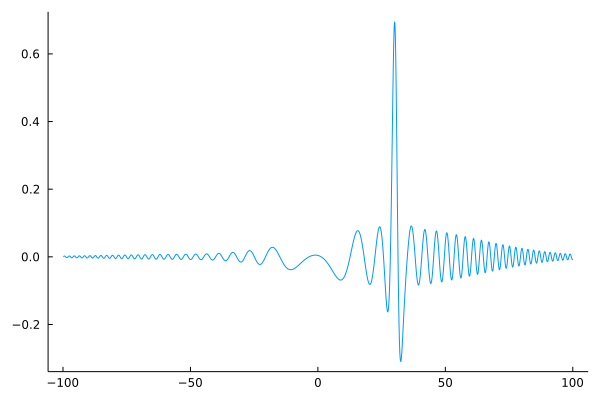

In [19]:
plot(x_vals,undamped_real, label = false, grid = false)

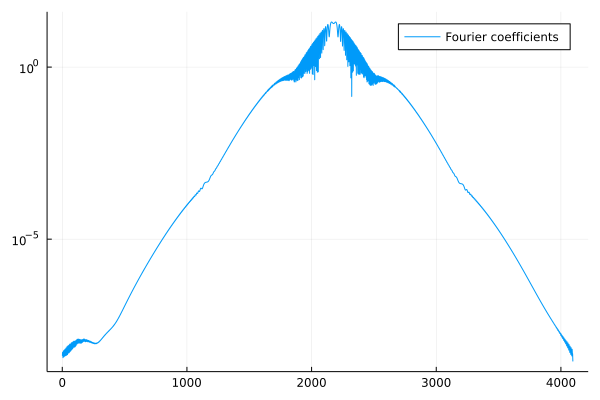

In [8]:
plot(abs.(c) .+ 1e-16, yaxis = :log, label = "Fourier coefficients") |> IJulia.display

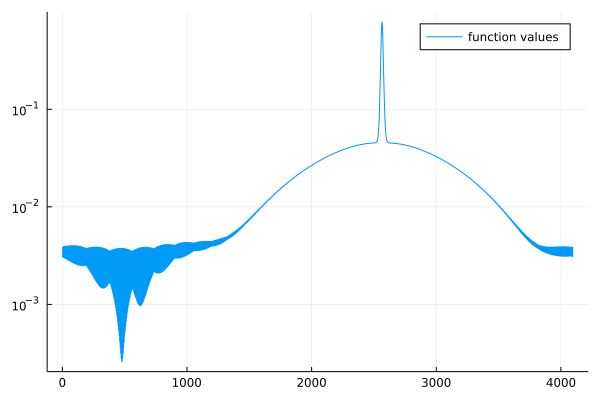

In [9]:
plot(abs.(mifft(c)), yaxis = :log, label = "function values")

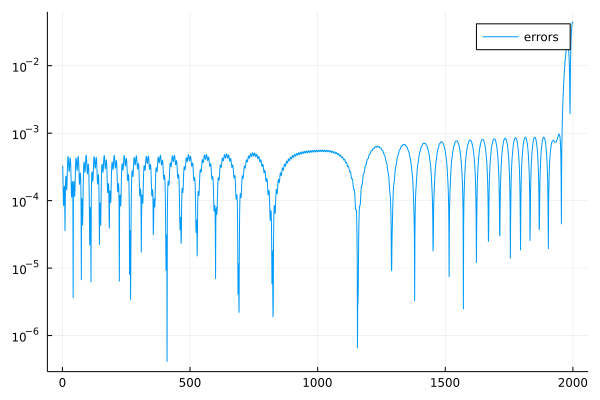

In [10]:
plot(abs.(undamped_real .- real_sol), yaxis = :log, label = "errors")

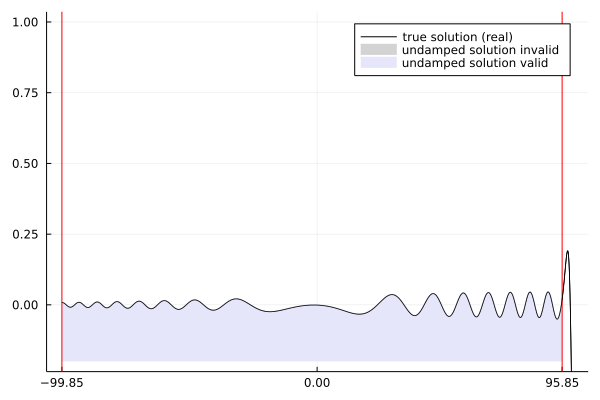

In [11]:
# real error
ϵ = 10^(-3);
errors = abs.(undamped_real .- real_sol) |> rnd

i = 1;
j = 1;
k = 1;
plots = 0;
plot(x_vals, real_sol, line = :black, linewidth = 0.8, label = "true solution (real)", yaxis=[-0.2,1])

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i != length(errors)
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], undamped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "undamped solution invalid")
                plot!(x_vals[i:k], undamped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "undamped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], undamped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], undamped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], undamped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, real_sol, line = :black, linewidth = 0.8, label = false)

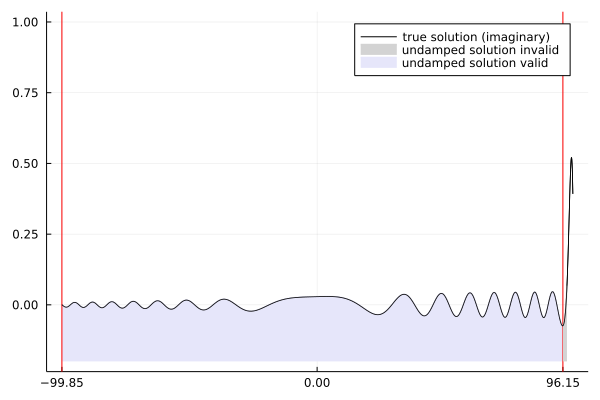

In [32]:
# imaginary error
ϵ = 10^(-3);
errors = abs.(undamped_imag .- imag_sol) |> rnd

i = 1;
j = 1;
k = 1;
plots = 0;
plot(x_vals, imag_sol, line = :black, linewidth = 0.8, label = "true solution (imaginary)", yaxis=[-0.2,1])

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i != length(errors)
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], undamped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "undamped solution invalid")
                plot!(x_vals[i:k], undamped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "undamped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], undamped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], undamped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k+1], undamped_imag[j:k+1], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, imag_sol, line = :black, linewidth = 0.8, label = false)

## Damped with sigma and gamma

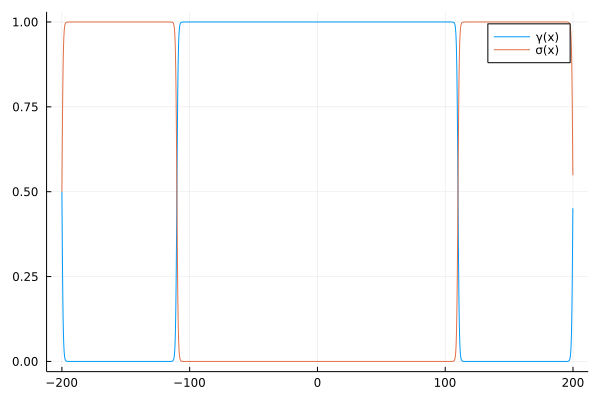

In [25]:
L = 200
m = 2^12
X = mgrid(m,L)

if isodd(m)
    n = (1-length(X))./2 .+ (0:(length(X)-1))
else
    n = -1 .* length(X) ./ 2 .+ (0:(length(X)-1))
end
D = (pi/L) * Diagonal(1im.*n)

ℓ1 = -L + (L/2) - 10
ℓ2 = L
σ1 = x -> (1 .- (0.5.*(tanh.((x.-ℓ1)) .+ 1) + 0.5.*(tanh.((-x.-ℓ2)) .+ 1)))
# make symmetric:
σ = x -> σ1(x) .+ σ1(-x)
γ = x -> 1 .- σ(-x) # should gamma be skinnier than sigma?

Σ = Diagonal(σ(X))
A = x -> x + (dt/2)*D*mfft(Σ*mifft(D*x))
B = x -> x - (dt/2)*D*mfft(Σ*mifft(D*x))
plot(X,γ(X),label = "γ(x)")
plot!(X,σ(X),label = "σ(x)")

In [27]:
σ1 = x -> (1 .- (0.5.*(tanh.((x.-ℓ1)) .+ 1) + 0.5.*(tanh.((-x.-ℓ2)) .+ 1)))
γ = x -> 1 .- σ1(x) .- σ1(-x)
plot(X,γ(X),label = "γ(x)")
savefig("fig14")

In [36]:
u = x -> (1 .+ x) .* exp.(im.*x .- 0.7.*x.^2)
c = mfft(u(X))
dt = 0.005
T = 150.0
t = 0.0
steps = convert(Int64,ceil(T/dt))

D2_dt = exp(im*D.^2 * (dt/2))
D2_3dt2 = exp(im*D.^2 * 3*dt/4)
D2_2dt = exp(im*D.^2 * dt)
iD2_dt = exp(-im*D.^2 * dt/2)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/4)
iD2_2dt = exp(-im*D.^2 * dt)
Mats1 = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

D2_dt = exp(im*D.^2 * dt)
D2_3dt2 = exp(im*D.^2 * 3*dt/2)
D2_2dt = exp(im*D.^2 * 2*dt)
iD2_dt = exp(-im*D.^2 * dt)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/2)
iD2_2dt = exp(-im*D.^2 * 2*dt)
Mats = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

@time begin

for i = 2:steps+1
    if t < 0.5
        a = rk4(c,Mats,dt)
        c = Mats[1] * a
    else
        a = rk4(c,Mats1,dt/2)
        c_til = Mats1[1] * a
        c_bar = CG(B, A(c_til), 1e-10)
        a = rk4(c_bar,Mats1,dt/2)
        c = Mats1[1] * a 
        
        # delete the RHS
        if isinteger(i / 1000)
            func_vals = mifft(c) .* γ(X)
            c = mfft(func_vals)
        end
    end           
    t += dt
end

fm = trig_interp(L,c)
damped_real = map(fm,x_vals) |> real
damped_imag = map(fm,x_vals) |> imag
    
end

real_error = abs(maximum(real_sol .- damped_real)) |> rnd
imag_error = abs(maximum(imag_sol .- damped_imag)) |> rnd

255.083044 seconds (55.06 M allocations: 599.194 GiB, 14.59% gc time, 0.03% compilation time)


0.001

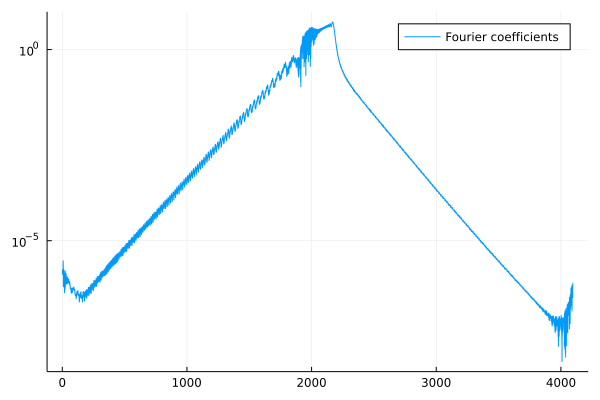

In [37]:
plot(abs.(c) .+ 1e-16, yaxis = :log, label = "Fourier coefficients")

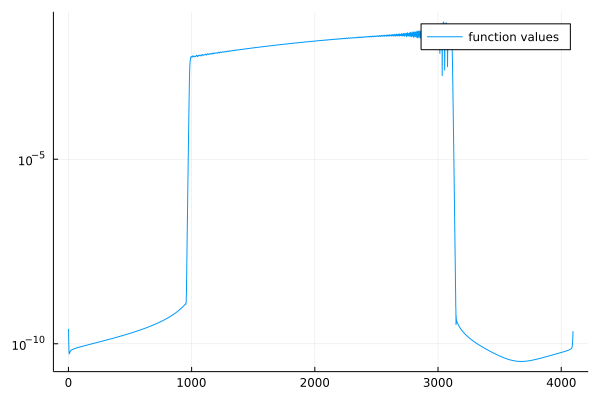

In [38]:
plot(abs.(mifft(c)), yaxis = :log, label = "function values")

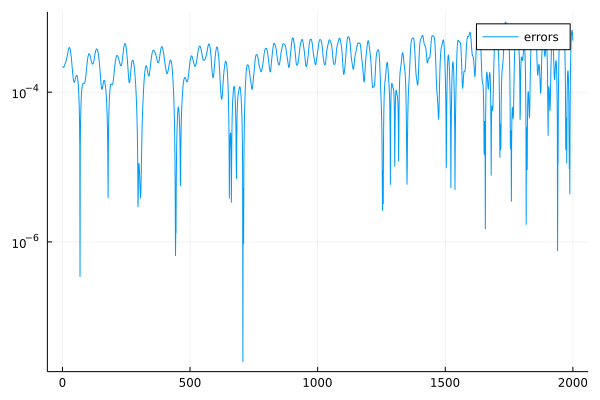

In [39]:
plot(abs.(damped_real .- real_sol),yaxis = :log, label = "errors")

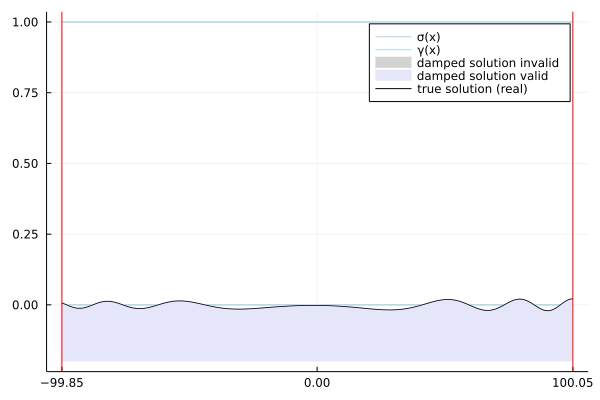

In [40]:
# real error
ϵ = 10^(-3)
errors = abs.(real_sol .- damped_real)

plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
plot!(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "γ(x)", yaxis = [-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "damped solution invalid")
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, real_sol, line = :black, linewidth = 0.8, label = "true solution (real)")

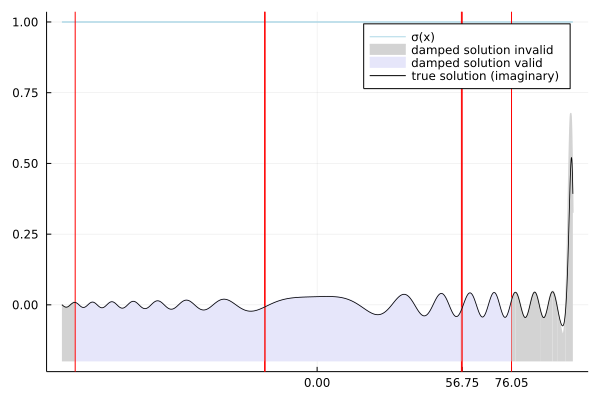

In [12]:
# imaginary error
ϵ = 10^(-3)
errors = abs.(imag_sol .- damped_imag)

plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
plot(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "damped solution invalid")
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, imag_sol, line = :black, linewidth = 0.8, label = "true solution (imaginary)")

## Damping with just sigma

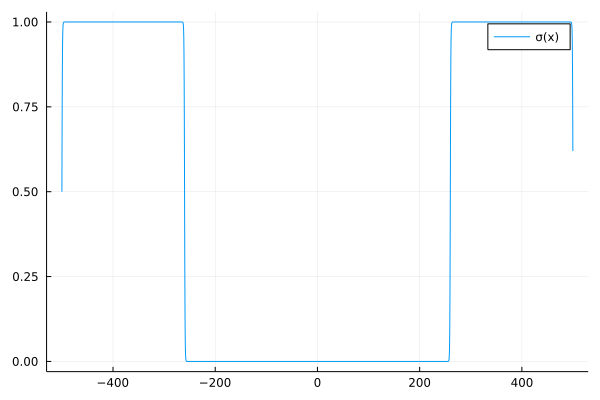

In [128]:
L = 500
m = 2^12
X = mgrid(m,L)

if isodd(m)
    n = (1-length(X))./2 .+ (0:(length(X)-1))
else
    n = -1 .* length(X) ./ 2 .+ (0:(length(X)-1))
end
D = (pi/L) * Diagonal(1im.*n)

ℓ1 = -L + (L/2) - 10
ℓ2 = L
σ1 = x -> (1 .- (0.5.*(tanh.((x.-ℓ1)) .+ 1) + 0.5.*(tanh.((-x.-ℓ2)) .+ 1)))
# make symmetric:
σ = x -> σ1(x) .+ σ1(-x)

Σ = Diagonal(σ(X))
A = x -> x + (dt/2)*D*mfft(Σ*mifft(D*x))
B = x -> x - (dt/2)*D*mfft(Σ*mifft(D*x))
plot(X,σ(X),label = "σ(x)")

In [129]:
u = x -> (1 .+ x) .* exp.(im.*x .- 0.7.*x.^2)
c = mfft(u(X))
dt = 0.005
T = 50.0
t = 0.0
steps = convert(Int64,ceil(T/dt))
a = c

# my attempt to make use new rk4 with strang splitting (didn't work):
D2_dt = exp(im*D.^2 * (dt/2))
D2_3dt2 = exp(im*D.^2 * 3*dt/4)
D2_2dt = exp(im*D.^2 * dt)
iD2_dt = exp(-im*D.^2 * dt/2)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/4)
iD2_2dt = exp(-im*D.^2 * dt)
Mats1 = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

D2_dt = exp(im*D.^2 * dt)
D2_3dt2 = exp(im*D.^2 * 3*dt/2)
D2_2dt = exp(im*D.^2 * 2*dt)
iD2_dt = exp(-im*D.^2 * dt)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/2)
iD2_2dt = exp(-im*D.^2 * 2*dt)
Mats = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

@time begin

for i = 2:steps+1
    if t < 0.5
        a = rk4(c,Mats,dt)
        c = Mats[1] * a
    else
        a = rk4(c,Mats1,dt/2)
        c_til = Mats1[1] * a
        c_bar = CG(B, A(c_til), 1e-10)
        a = rk4(c_bar,Mats1,dt/2)
        c = Mats1[1] * a    
    end           
    t += dt
end

fm = trig_interp(L,c)
damped_real = map(fm,x_vals) |> real
damped_imag = map(fm,x_vals) |> imag
    
end

real_error = abs(maximum(real_sol .- damped_real)) |> rnd
imag_error = abs(maximum(imag_sol .- damped_imag)) |> rnd

 97.798685 seconds (14.91 M allocations: 150.485 GiB, 18.97% gc time, 0.28% compilation time)


0.09908

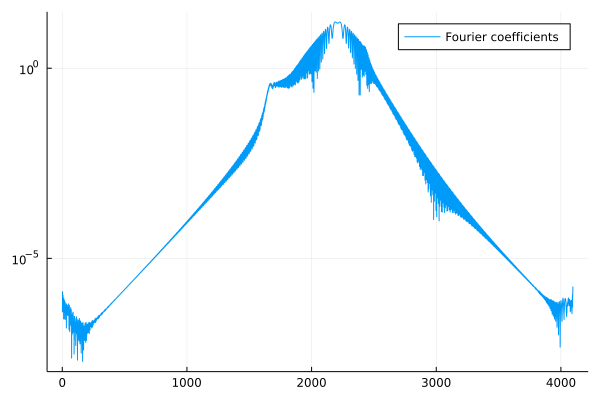

In [84]:
plot(abs.(c) .+ 1e-16, yaxis = :log, label = "Fourier coefficients")

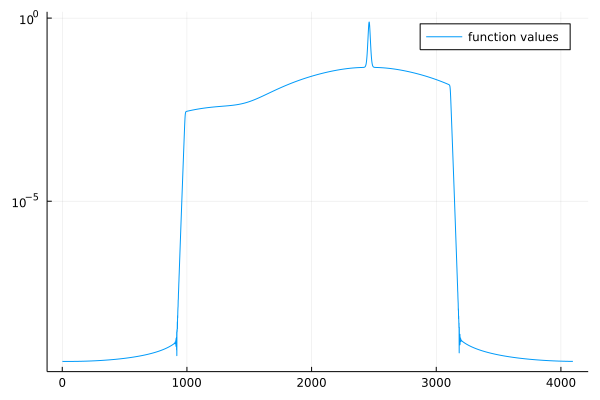

In [85]:
plot(abs.(mifft(c)), yaxis = :log, label = "function values")

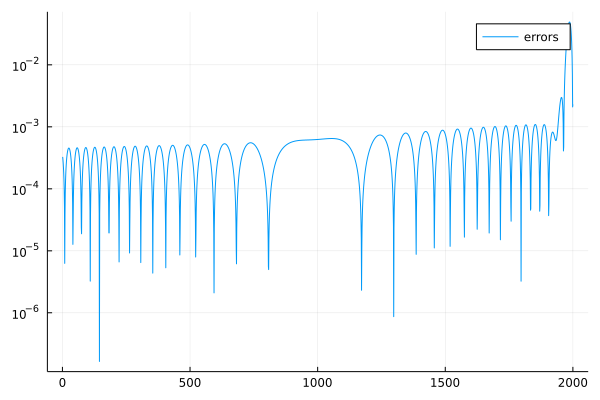

In [86]:
plot(abs.(damped_real .- real_sol), yaxis = :log, label = "errors")

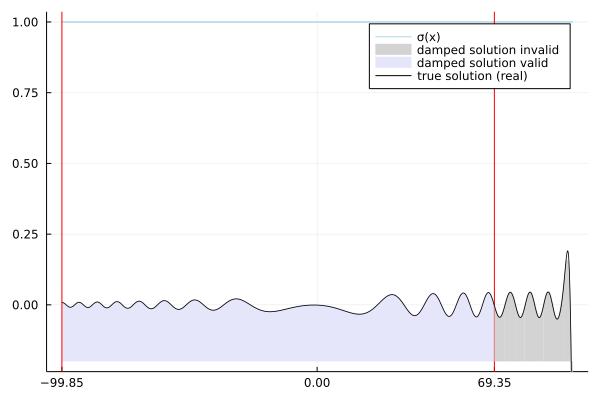

In [87]:
# real error
ϵ = 10^(-3)
errors = abs.(real_sol .- damped_real)

plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
plot(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "damped solution invalid")
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, real_sol, line = :black, linewidth = 0.8, label = "true solution (real)")

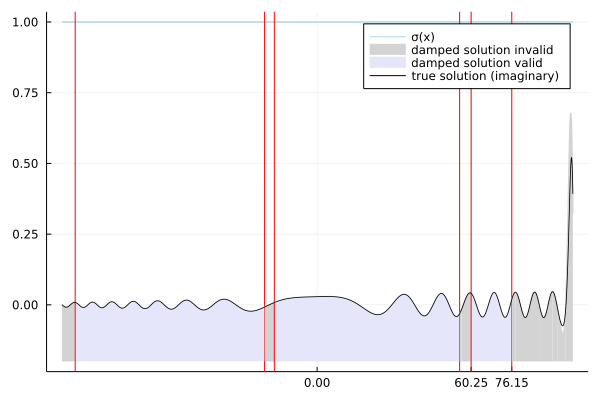

In [16]:
# imaginary error
ϵ = 10^(-3)
errors = abs.(imag_sol .- damped_imag)

plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
plot(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "damped solution invalid")
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, imag_sol, line = :black, linewidth = 0.8, label = "true solution (imaginary)")

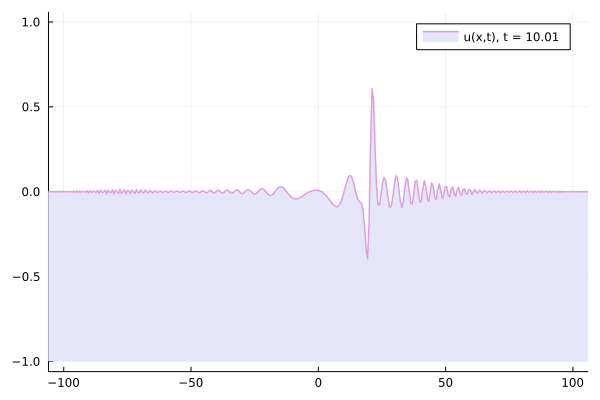

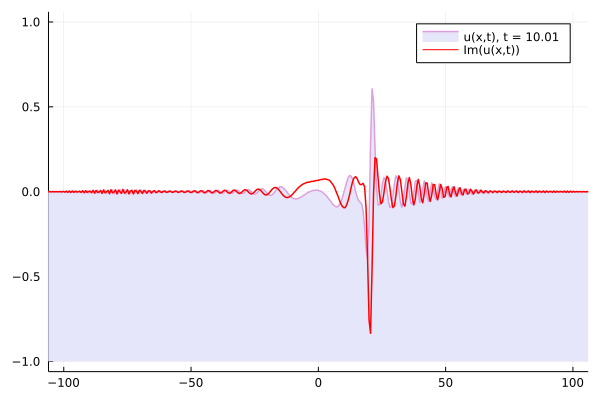

┌ Info: Saved animation to 
│   fn = C:\Users\annie\Dropbox\ArtificialBoundaryConditions\damped_NLS.gif
└ @ Plots C:\Users\annie\.julia\packages\Plots\yfzIY\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\annie\\Dropbox\\ArtificialBoundaryConditions\\damped_NLS.gif")
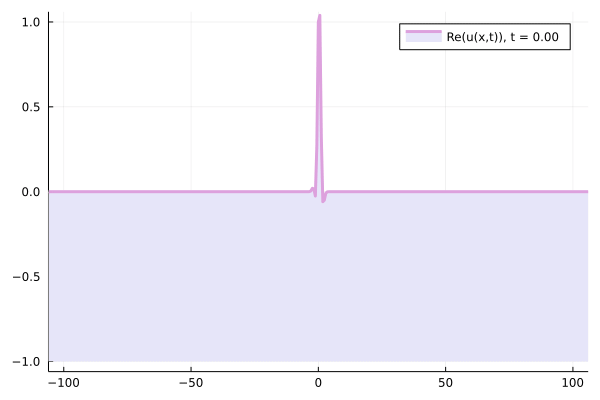

In [39]:
# animating damped solution
u = x -> (1 .+ x) .* exp.(im.*x .- 0.7.*x.^2)
c = mfft(u(X))
dt = 0.01
T = 10.0
t = 0.0
steps = convert(Int64,ceil(T/dt))

anim = Animation()
plot(X, mifft(c) |> real, fill = (-1,:lavender), line = :plum, linewidth = 3, yaxis = [-1,1], xaxis = [-100,100], label = @sprintf("Re(u(x,t)), t = %1.2f",t)) |> IJulia.display
frame(anim)
t += dt
fr = 100 #frames/unit time
tb = convert(Int64,ceil(steps/(fr*T)))
a = c

for i = 2:steps+1
    if t < 0.5
        a = rk4(c,dt,dt)
        c = exp(im*D.^2*dt) * a
    else
        a = rk4(c,dt/2,dt/2)
        c_til = exp(im*D.^2*dt/2) * a
        c_bar = CG(B, A(c_til), 1e-10)
        a = rk4(c_bar,dt/2,dt/2)
        c = exp(im*D.^2*dt/2) * a 
    end
    t += dt
    
    if mod(i-1,tb) ≈ 0.0
        U = mifft(c)
        IJulia.clear_output(true)    
        plot(X, U |> real, fill = (-1,:lavender), line = :plum, linewidth = 1.5, yaxis = [-1,1], xaxis = [-100,100], label = @sprintf("Re(u(x,t)), t = %1.2f",t)) |> IJulia.display
        plot!(X, U |> imag, line = :red, linewidth = 1.5, yaxis = [-1,1], xaxis = [-100,100], label = "Im(u(x,t))") |> IJulia.display
        frame(anim)
    end
end

gif(anim,"damped_NLS.gif")

## Damping with just gamma

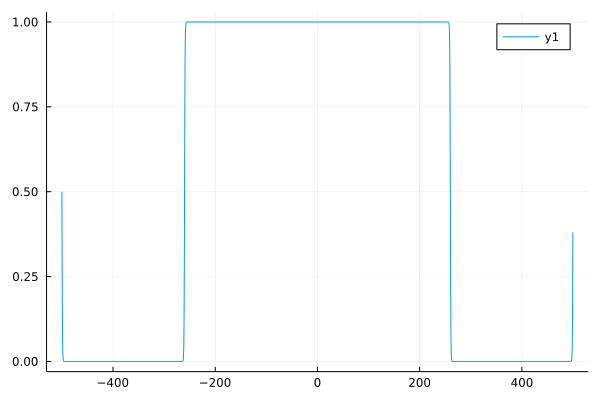

In [20]:
L = 500
m = 2^12
X = mgrid(m,L)

if isodd(m)
    n = (1-length(X))./2 .+ (0:(length(X)-1))
else
    n = -1 .* length(X) ./ 2 .+ (0:(length(X)-1))
end
D = (pi/L) * Diagonal(1im.*n)

ℓ1 = -L + (L/2) - 10
ℓ2 = L
σ1 = x -> (1 .- (0.5.*(tanh.((x.-ℓ1)) .+ 1) + 0.5.*(tanh.((-x.-ℓ2)) .+ 1)))
σ = x -> σ1(x) .+ σ1(-x)
γ = x -> 1 .- σ(-x)

plot(X,γ(X))

In [23]:
u = x -> (1 .+ x) .* exp.(im.*x .- 0.7.*x.^2)
c = mfft(u(X))
dt = 0.005
T = 150.0
t = 0.0
steps = convert(Int64,ceil(T/dt))

D2_dt = exp(im*D.^2 * dt)
D2_3dt2 = exp(im*D.^2 * 3*dt/2)
D2_2dt = exp(im*D.^2 * 2*dt)
iD2_dt = exp(-im*D.^2 * dt)
iD2_3dt2 = exp(-im*D.^2 * 3*dt/2)
iD2_2dt = exp(-im*D.^2 * 2*dt)
Mats = [D2_dt,D2_3dt2,D2_2dt,iD2_dt,iD2_3dt2,iD2_2dt];

@time begin

for i = 2:steps+1 # using double bump sigma
    a = rk4(c,Mats,dt)
    c = D2_dt * a
        
    # delete the RHS
    if isinteger(i / 1000)
        func_vals = mifft(c) .* γ(X)
        c = mfft(func_vals)
    end
    t += dt
end

fm = trig_interp(L,c)
damped_real = map(fm,x_vals) |> real
damped_imag = map(fm,x_vals) |> imag
    
end

real_error = abs(maximum(real_sol .- damped_real)) |> rnd
imag_error = abs(maximum(imag_sol .- damped_imag)) |> rnd
real_error

 77.819434 seconds (11.28 M allocations: 110.596 GiB, 11.92% gc time)


0.0005

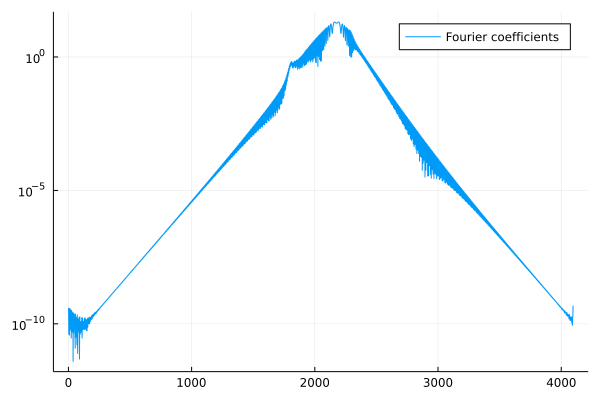

In [15]:
plot(abs.(c) .+ 1e-16, yaxis = :log, label = "Fourier coefficients")

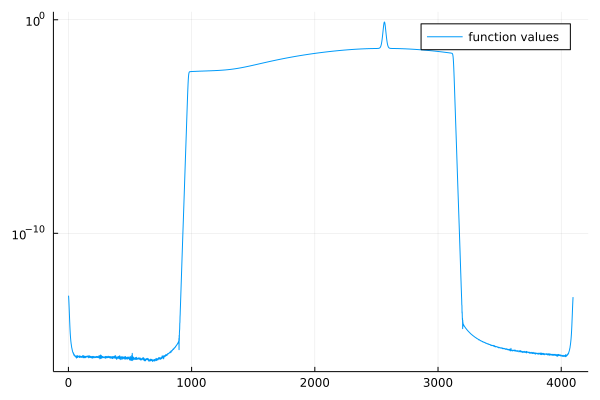

In [16]:
plot(abs.(mifft(c)) .+ 1e-16, yaxis = :log, label = "function values")

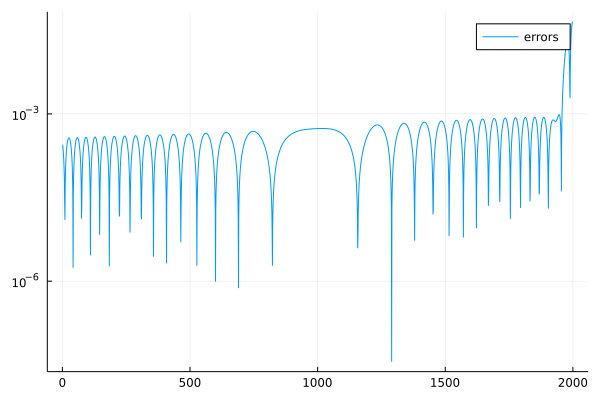

In [17]:
plot(abs.(damped_real .- real_sol), yaxis = :log, label = "errors")

In [32]:
# real error
ϵ = 10^(-3)
errors = abs.(real_sol .- damped_real)

#plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
#plot!(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "γ(x)", yaxis = [-0.2,1])
plot(x_vals, real_sol, line = :black, linewidth = 0.8, label = "true solution (real)", yaxis=[-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_real[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_real[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_real[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, real_sol, line = :black, linewidth = 0.8, label = false)
savefig("fig15")

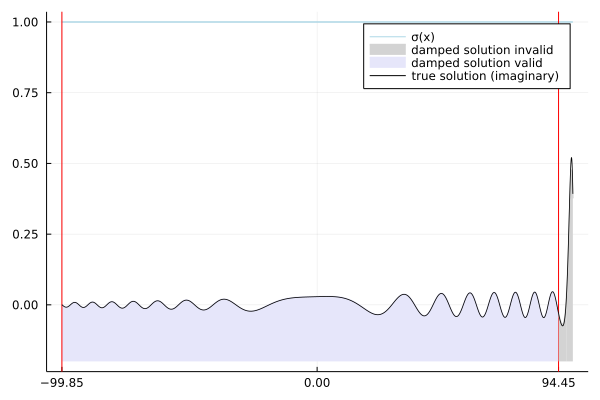

In [22]:
# imaginary error
ϵ = 10^(-3)
errors = abs.(imag_sol .- damped_imag)

plot(x_vals, σ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])
plot(x_vals, γ(x_vals), line = :lightblue, linewidth = 1.5, label = "σ(x)", yaxis = [-0.2,1])

i = 1;
j = 1;
k = 1;
plots = 0;

while j < length(errors)  
    i = k;
    while errors[i] > ϵ && i < length(errors)
        i += 1
    end
    
    k = i;
    
    if i == length(errors)
        plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
    else
        x_min = x_vals[i];
        
        while errors[k] < ϵ && k < length(errors)
            k += 1
        end
        x_max = x_vals[k];
        
        if (x_max - x_min) > 10
            if plots == 0
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = "damped solution invalid")
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = "damped solution valid")
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            else
                plot!(x_vals[j:i], damped_imag[j:i], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
                plot!(x_vals[i:k], damped_imag[i:k], fill = (-0.2,:lavender), line = :lavender, linewidth = 1.5, label = false)
                plot!([x_min,x_max], seriestype = :vline, line = :red, label = false, xticks = [x_min,x_max,0])
            end
            plots = 1;
        else
            plot!(x_vals[j:k], damped_imag[j:k], fill = (-0.2,:lightgrey), line = :lightgrey, linewidth = 1.5, label = false)
        end
    end
    j = k;
end

plot!(x_vals, imag_sol, line = :black, linewidth = 0.8, label = "true solution (imaginary)")